*Author: Dimas*
# Trees And Forests

### In this notebook, we will be using Classification Trees and Random Forests in order to predict the outcome of a game, using the timings of first objectives completed.

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=(FutureWarning, UserWarning) )

import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import ast
pd.set_option('mode.chained_assignment', None)

In [2]:
gameData = pd.read_csv("datasets/LeagueofLegends.csv")
gameData.head()

,League,Year,Season,Type,blueTeamTag,bResult,rResult,redTeamTag,gamelength,golddiff,...,redMiddleChamp,goldredMiddle,redADC,redADCChamp,goldredADC,redSupport,redSupportChamp,goldredSupport,redBans,Address
0,NALCS,2015,Spring,Season,TSM,1,0,C9,40,"[0, 0, -14, -65, -268, -431, -488, -789, -494,...",...,Fizz,"[475, 475, 552, 842, 1178, 1378, 1635, 1949, 2...",Sneaky,Sivir,"[475, 475, 532, 762, 1097, 1469, 1726, 2112, 2...",LemonNation,Thresh,"[515, 515, 577, 722, 911, 1042, 1194, 1370, 14...","['Tristana', 'Leblanc', 'Nidalee']",http://matchhistory.na.leagueoflegends.com/en/...
1,NALCS,2015,Spring,Season,CST,0,1,DIG,38,"[0, 0, -26, -18, 147, 237, -152, 18, 88, -242,...",...,Azir,"[475, 475, 552, 786, 1097, 1389, 1660, 1955, 2...",CoreJJ,Corki,"[475, 475, 532, 868, 1220, 1445, 1732, 1979, 2...",KiWiKiD,Annie,"[515, 515, 583, 752, 900, 1066, 1236, 1417, 15...","['RekSai', 'Janna', 'Leblanc']",http://matchhistory.na.leagueoflegends.com/en/...
2,NALCS,2015,Spring,Season,WFX,1,0,GV,40,"[0, 0, 10, -60, 34, 37, 589, 1064, 1258, 913, ...",...,Azir,"[475, 475, 533, 801, 1006, 1233, 1385, 1720, 1...",Cop,Corki,"[475, 475, 533, 781, 1085, 1398, 1782, 1957, 2...",BunnyFuFuu,Janna,"[515, 515, 584, 721, 858, 1002, 1168, 1303, 14...","['Leblanc', 'Zed', 'RekSai']",http://matchhistory.na.leagueoflegends.com/en/...
3,NALCS,2015,Spring,Season,TIP,0,1,TL,41,"[0, 0, -15, 25, 228, -6, -243, 175, -346, 16, ...",...,Lulu,"[475, 475, 532, 771, 1046, 1288, 1534, 1776, 2...",KEITH,KogMaw,"[475, 475, 532, 766, 1161, 1438, 1776, 1936, 2...",Xpecial,Janna,"[515, 515, 583, 721, 870, 1059, 1205, 1342, 15...","['RekSai', 'Rumble', 'LeeSin']",http://matchhistory.na.leagueoflegends.com/en/...
4,NALCS,2015,Spring,Season,CLG,1,0,T8,35,"[40, 40, 44, -36, 113, 158, -121, -191, 23, 20...",...,Lulu,"[475, 475, 532, 807, 1042, 1338, 1646, 1951, 2...",Maplestreet8,Corki,"[475, 475, 532, 792, 1187, 1488, 1832, 2136, 2...",Dodo8,Annie,"[475, 475, 538, 671, 817, 948, 1104, 1240, 136...","['Rumble', 'Sivir', 'Rengar']",http://matchhistory.na.leagueoflegends.com/en/...


### Filter out only the columns we need.

In [3]:
relevantData = gameData.filter(['bResult', 'bInhibs', 'rInhibs', 'bTowers', 'rTowers', 'bDragons', 'rDragons', 'bBarons', 'rBarons', 'bKills', 'rKills'], axis=1)
#all the 1's on bResult are blue team winning, 0 is red team win.
relevantData.head(len(relevantData))

,bResult,bInhibs,rInhibs,bTowers,rTowers,bDragons,rDragons,bBarons,rBarons,bKills,rKills
0,1,"[[36.686, 'MID_LANE'], [29.274, 'MID_LANE']]",[],"[[27.542, 'MID_LANE', 'BASE_TURRET'], [39.269,...","[[39.23, 'TOP_LANE', 'INNER_TURRET'], [20.681,...","[[37.267, None]]","[[17.14, None], [30.934, None], [24.641, None]]",[],[[29.954]],"[[10.82, 'C9 Hai', 'TSM Bjergsen', [], 9229, 8...","[[16.529, 'TSM Lustboy', 'C9 Balls', ['C9 Mete..."
1,0,[],"[[36.813, 'MID_LANE']]","[[23.239, 'BOT_LANE', 'OUTER_TURRET'], [33.018...","[[19.257, 'MID_LANE', 'OUTER_TURRET'], [15.206...","[[32.545, None], [26.177, None], [19.119, None]]","[[12.264, None]]",[[29.255]],[],"[[11.104, 'DIG Shiphtur', 'CST Jesiz', ['CST I...","[[12.387, 'CST Jesiz', 'DIG Gamsu', ['DIG Ship..."
2,1,"[[37.511, 'TOP_LANE'], [37.38, 'BOT_LANE'], [3...",[],"[[15.045, 'BOT_LANE', 'OUTER_TURRET'], [39.566...","[[24.62, 'MID_LANE', 'OUTER_TURRET'], [30.493,...","[[24.577, None], [37.867, None], [30.87, None]...",[],[[35.144]],[],"[[5.255, 'GV Keane', 'WFX Pobelter', ['WFX Sho...","[[8.449, 'WFX Altec', 'GV Cop', ['GV BunnyFuFu..."
3,0,[],"[[35.867, 'MID_LANE']]","[[19.941, 'BOT_LANE', 'OUTER_TURRET'], [38.77,...","[[36.384, 'MID_LANE', 'NEXUS_TURRET'], [31.665...",[],"[[26.274, None], [10.153, None], [18.515, None...",[[37.513]],[],"[[8.274, 'TL Quas', 'TIP Rhux', ['TIP Apollo']...","[[7.768, 'TIP Rush', 'TL IWDominate', ['TL Fen..."
4,1,"[[34.069, 'BOT_LANE']]",[],"[[22.594, 'MID_LANE', 'OUTER_TURRET'], [34.213...","[[11.644, 'MID_LANE', 'OUTER_TURRET'], [12.438...","[[14.589, None], [30.307, None]]","[[21.901, None]]",[[32.556]],[],"[[11.438, 'T8 Dodo8', 'CLG Doublelift', ['CLG ...","[[11.988, 'CLG Doublelift', 'T8 Porpoise8', ['..."
...,...,...,...,...,...,...,...,...,...,...,...
7615,0,[],"[[30.225, 'MID_LANE']]","[[12.448, 'BOT_LANE', 'OUTER_TURRET'], [27.646...","[[25.005, 'TOP_LANE', 'OUTER_TURRET'], [18.149...",[],"[[10.135, 'FIRE_DRAGON'], [26.468, 'AIR_DRAGON...",[],"[[24.571], [32.829]]","[[9.158, 'SUP SnowFlower', 'YC CoCo', ['YC Moj...","[[12.593, 'YC Mojito', 'SUP GBM', ['SUP Stomag..."
7616,0,[],"[[30.085, 'TOP_LANE'], [37.98, 'MID_LANE']]","[[23.085, 'BOT_LANE', 'INNER_TURRET'], [17.368...","[[38.311, 'MID_LANE', 'NEXUS_TURRET'], [10.572...","[[18.322, 'WATER_DRAGON'], [25.473, 'AIR_DRAGO...","[[32.015, 'FIRE_DRAGON'], [11.743, 'FIRE_DRAGO...","[[29.193], [21.621]]",[],"[[17.174, 'DP Marshall', 'GAL Rare', ['GAL Vik...","[[3.361, 'GAL Veux', 'DP KaKAO', ['DP Ruvelius..."
7617,0,[],"[[23.575, 'MID_LANE'], [18.959, 'BOT_LANE'], [...",[],"[[22.854, 'TOP_LANE', 'BASE_TURRET'], [23.285,...",[],"[[8.858, 'WATER_DRAGON'], [15.513, 'EARTH_DRAG...",[],[[21.6]],"[[13.534, 'DW Cupcake', 'SIN Bdoink', ['SIN Ju...","[[6.996, 'SIN Juves', 'DW Chippys', ['DW Prael..."
7618,1,"[[33.943, 'MID_LANE']]",[],"[[22.043, 'TOP_LANE', 'OUTER_TURRET'], [24.727...","[[32.793, 'BOT_LANE', 'INNER_TURRET'], [22.866...","[[12.083, 'AIR_DRAGON'], [18.238, 'FIRE_DRAGON...",[],"[[25.777], [32.977]]",[],"[[3.055, 'TTC Swathe', 'LGC Sybol', [], 9751, ...","[[13.399, 'LGC Sybol', 'TTC Shok', ['TTC Swath..."


### Create a new dataset with only the first values.

In [4]:
for x in relevantData:
    if x != 'bResult':
        relevantData[x] = relevantData[x].apply(ast.literal_eval) #changing all the string values to lists.

for x in relevantData:
    if x != 'bResult':
        for y in range(7620):
            if relevantData[x][y] != []:
                relevantData[x][y] = relevantData[x][y][0]
            else:
                relevantData[x][y] = None

# creating a better dataset by combining red and blue teams
betterData = {
    "win": [],
    "firstTower": [],
    "firstDragon": [],
    "firstBaron": [],
    "firstKill": [],
    "firstInhib" : [],
}

for index in range(7620):
    if relevantData["bResult"][index] == 1:
        #blue wins
        betterData["win"].append(True)
        betterData["firstInhib"].append(relevantData["bInhibs"][index])
        betterData["firstTower"].append(relevantData["bTowers"][index])
        betterData["firstDragon"].append(relevantData["bDragons"][index])
        betterData["firstBaron"].append(relevantData["bBarons"][index])
        betterData["firstKill"].append(relevantData["bKills"][index])
        betterData["win"].append(False)
        betterData["firstInhib"].append(relevantData["rInhibs"][index])
        betterData["firstTower"].append(relevantData["rTowers"][index])
        betterData["firstDragon"].append(relevantData["rDragons"][index])
        betterData["firstBaron"].append(relevantData["rBarons"][index])
        betterData["firstKill"].append(relevantData["rKills"][index])
    else:
        #red wins.
        betterData["win"].append(True)
        betterData["firstInhib"].append(relevantData["rInhibs"][index])
        betterData["firstTower"].append(relevantData["rTowers"][index])
        betterData["firstDragon"].append(relevantData["rDragons"][index])
        betterData["firstBaron"].append(relevantData["rBarons"][index])
        betterData["firstKill"].append(relevantData["rKills"][index])
        betterData["win"].append(False)
        betterData["firstInhib"].append(relevantData["bInhibs"][index])
        betterData["firstTower"].append(relevantData["bTowers"][index])
        betterData["firstDragon"].append(relevantData["bDragons"][index])
        betterData["firstBaron"].append(relevantData["bBarons"][index])
        betterData["firstKill"].append(relevantData["bKills"][index])

teamData = pd.DataFrame(betterData)
teamData

,win,firstTower,firstDragon,firstBaron,firstKill,firstInhib
0,True,"[27.542, MID_LANE, BASE_TURRET]","[37.267, None]",None,"[10.82, C9 Hai, TSM Bjergsen, [], 9229, 8469]","[36.686, MID_LANE]"
1,False,"[39.23, TOP_LANE, INNER_TURRET]","[17.14, None]",[29.954],"[16.529, TSM Lustboy, C9 Balls, [C9 Meteos, C9...",None
2,True,"[19.257, MID_LANE, OUTER_TURRET]","[12.264, None]",None,"[12.387, CST Jesiz, DIG Gamsu, [DIG Shiphtur],...","[36.813, MID_LANE]"
3,False,"[23.239, BOT_LANE, OUTER_TURRET]","[32.545, None]",[29.255],"[11.104, DIG Shiphtur, CST Jesiz, [CST Impaler...",None
4,True,"[15.045, BOT_LANE, OUTER_TURRET]","[24.577, None]",[35.144],"[5.255, GV Keane, WFX Pobelter, [WFX ShorterAC...","[37.511, TOP_LANE]"
...,...,...,...,...,...,...
15235,False,None,None,None,"[13.534, DW Cupcake, SIN Bdoink, [SIN Juves, S...",None
15236,True,"[22.043, TOP_LANE, OUTER_TURRET]","[12.083, AIR_DRAGON]",[25.777],"[3.055, TTC Swathe, LGC Sybol, [], 9751, 7219]","[33.943, MID_LANE]"
15237,False,"[32.793, BOT_LANE, INNER_TURRET]",None,None,"[13.399, LGC Sybol, TTC Shok, [TTC Swathe], 10...",None
15238,True,"[32.298, MID_LANE, INNER_TURRET]","[35.963, ELDER_DRAGON]",[26.427],"[10.327, TTC Papryze, LGC Ceres, [LGC Sybol], ...","[37.152, BOT_LANE]"


### Only get the timing data.
Here we will get the timing of the first objective of each team. If it does not exist, we will set it to a arbitrary large number 999


In [5]:
teamDataValues = teamData
for name in teamDataValues:
    if name != 'win':
        for index in range(len(teamDataValues)):
            if teamDataValues[name][index] != None:
                teamDataValues[name][index] = teamDataValues[name][index][0]
            else:
                teamDataValues[name][index] = 999

teamDataValues

,win,firstTower,firstDragon,firstBaron,firstKill,firstInhib
0,True,27.542,37.267,999,10.82,36.686
1,False,39.23,17.14,29.954,16.529,999
2,True,19.257,12.264,999,12.387,36.813
3,False,23.239,32.545,29.255,11.104,999
4,True,15.045,24.577,35.144,5.255,37.511
...,...,...,...,...,...,...
15235,False,999,999,999,13.534,999
15236,True,22.043,12.083,25.777,3.055,33.943
15237,False,32.793,999,999,13.399,999
15238,True,32.298,35.963,26.427,10.327,37.152


# Let's create a classification tree solely based on the first tower takedown.

In [6]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import plot_tree

#function to get the tree against win with 80:20 train test split, along with test data
def getTree(var, depth):
    #getting the series data for each variable
    resultSeries = (teamDataValues['win'])
    varSeries = (teamDataValues[var])
    #dropping indexes that have None in them
    indexesDropped = []
    for x in range(len(teamDataValues)):
        if varSeries[x] == None:
            indexesDropped.append(x)
    resultSeries = resultSeries.drop(indexesDropped)
    varSeries = varSeries.drop(indexesDropped)
    resultSeries = pd.DataFrame(resultSeries)
    varSeries = pd.DataFrame(varSeries)
    #forming train and test set.
    varSeries_train, varSeries_test, resultSeries_train, resultSeries_test = train_test_split(varSeries, resultSeries, test_size = 0.20)
    #using normal classification tree.
    tree = DecisionTreeClassifier(max_depth=depth)
    tree.fit(varSeries_train, resultSeries_train)
    #returns 3 things; the tree itself, and the train/test data
    trainTestdata = (varSeries_train, varSeries_test, resultSeries_train, resultSeries_test)
    return tree, trainTestdata, indexesDropped

def printTree(tree, data, sizeTuple=(75,25)):
    f = plt.figure(figsize=sizeTuple)
    plot_tree(tree,
        feature_names=data[0].columns,
        filled=True, rounded=True, 
        class_names=["Loss","Win"])
    

#### lets try 7 levels first

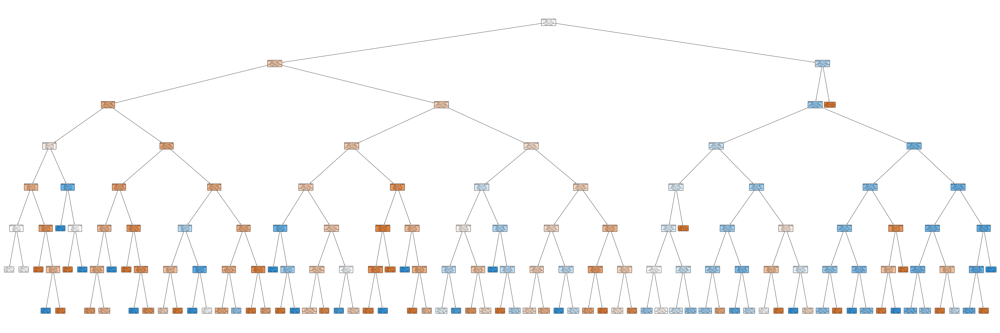

In [8]:
towerTree, towerTree_data, _ = getTree("firstTower", 7) #<<<< change the tree level here!
printTree(towerTree, towerTree_data)

### Let's do the same for the 4 other variables: firstInhib, firstDragon, firstBaron and firstKill.

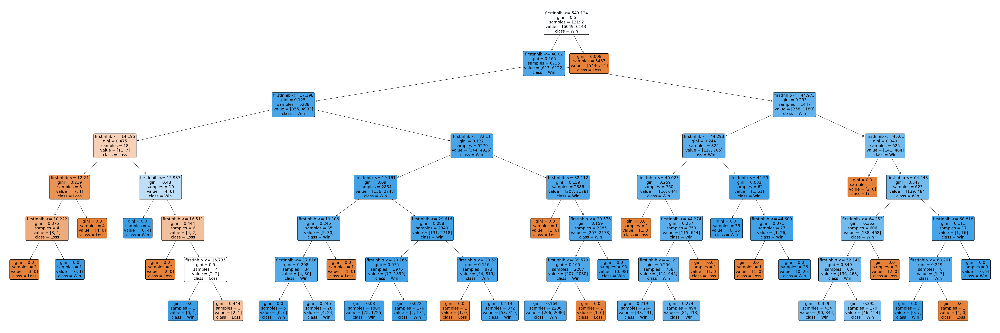

In [9]:
inhibTree, inhibTree_data, _ = getTree("firstInhib", 7)
printTree(inhibTree, inhibTree_data)

number of teams remaining after removing None values: 0


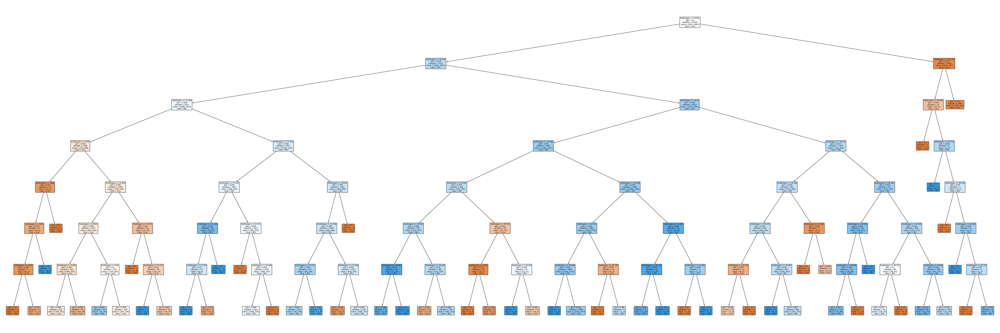

In [10]:
dragonTree, dragonTree_data, dragon_nonull = getTree("firstDragon", 7)
print(f"number of teams remaining after removing None values: {len(dragon_nonull)}")
printTree(dragonTree, dragonTree_data)

number of teams remaining after removing None values: 0


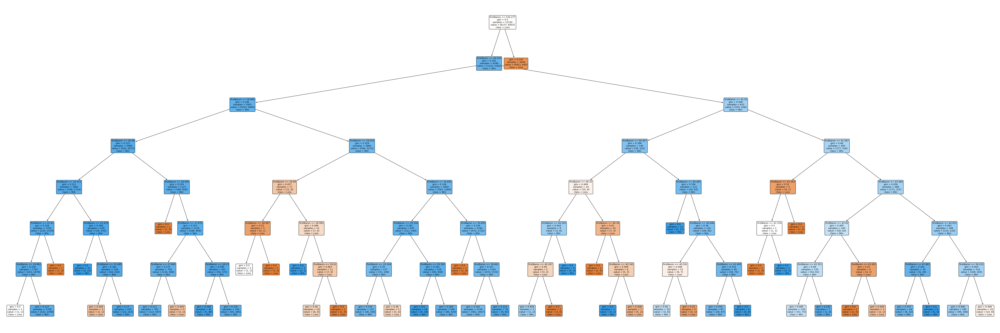

In [11]:
baronTree, baronTree_data, baron_nonull  = getTree("firstBaron", 7)
print(f"number of teams remaining after removing None values: {len(baron_nonull)}")
printTree(baronTree, baronTree_data)

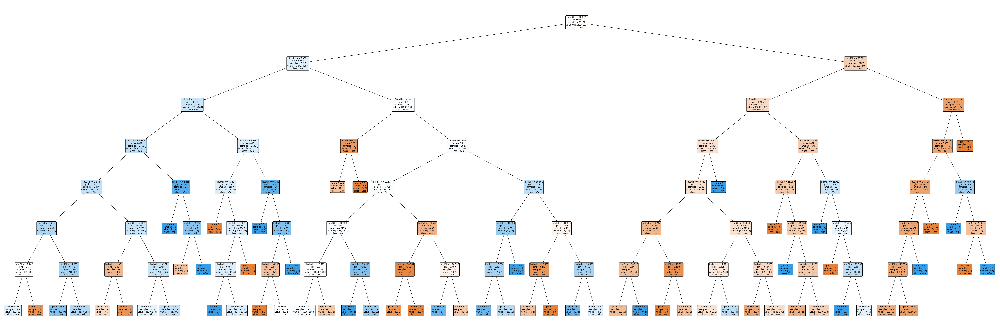

In [12]:
killTree, killTree_data, noKill = getTree("firstKill", 7)
printTree(killTree, killTree_data)

## Finally, let's create a combined classification tree that combines all the variables together.



In [14]:
#clear out all rows that have None
indexesToBeDropped = []
for var in teamDataValues:
    for index in range(len(teamDataValues)):
        if teamDataValues[var][index] == None:
            indexesToBeDropped.append(index)
teamDataValues_noNull = teamDataValues.drop(indexesToBeDropped)
teamDataValues_noNull.head(len(teamDataValues_noNull))
combined = teamDataValues_noNull[['firstTower', 'firstDragon', 'firstBaron', 'firstKill', 'firstInhib']]
result = teamDataValues_noNull[['win']]
combined_train, combined_test, result_train, result_test = train_test_split(combined, result, test_size = 0.20)
combinedTree_data = (combined_train, combined_test, result_train, result_test)

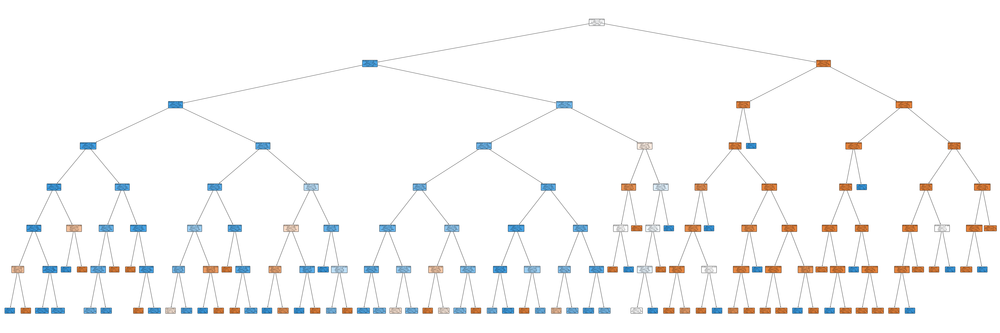

In [16]:
#create and print multivariate tree.
combinedTree = DecisionTreeClassifier(max_depth=7)
combinedTree.fit(combined_train, result_train)
printTree(combinedTree, combinedTree_data)

# Now, let's find out the accuracy of each of these trees.
This is a function to print out the relevant data to support this.

In [17]:
#function that presents the accuracy of a tree
def showTreeAccuracy(tree, tree_data):
    #get train/test data
    X_train, X_test, y_train, y_test = tree_data
    #make predictions from train and test data
    y_train_pred = tree.predict(X_train)
    y_test_pred = tree.predict(X_test)
    # Check the Goodness of Fit (on Train Data)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Classification Accuracy \t:", tree.score(X_train, y_train))
    print()
    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", tree.score(X_test, y_test))
    print()
    # Plot the Confusion Matrix for Train and Test
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    f.suptitle("TRAIN / TEST", fontsize=16)
    sb.heatmap(confusion_matrix(y_train, y_train_pred),
            annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
    sb.heatmap(confusion_matrix(y_test, y_test_pred), 
            annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

Accuracy of first tower destroyed timing classification tree.
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.67749343832021

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6499343832020997



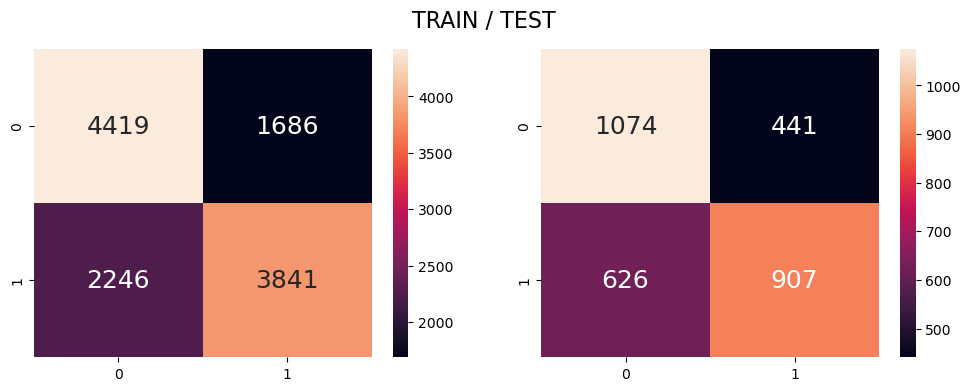

In [18]:
print("Accuracy of first tower destroyed timing classification tree.")
showTreeAccuracy(towerTree, towerTree_data)

Accuracy of first inhibitor destroyed timing classification tree.
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9498031496062992

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.949475065616798



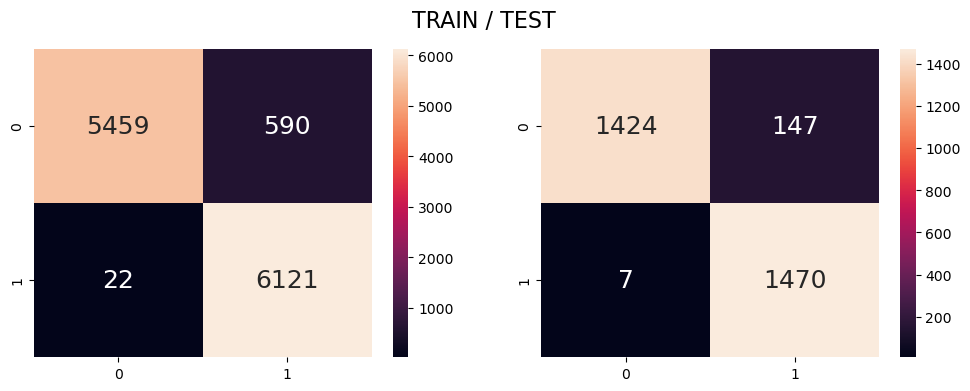

In [19]:
print("Accuracy of first inhibitor destroyed timing classification tree.")
showTreeAccuracy(inhibTree, inhibTree_data)

Accuracy of first dragon kill timing classification tree.
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6878280839895013

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6847112860892388



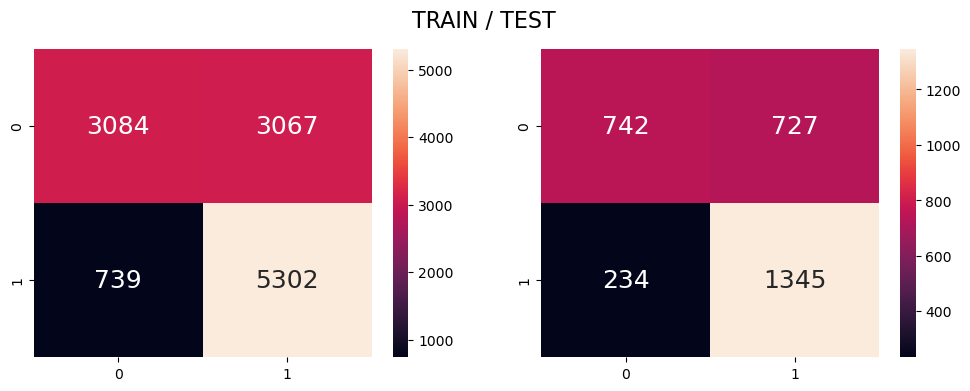

In [20]:
print("Accuracy of first dragon kill timing classification tree.")
showTreeAccuracy(dragonTree, dragonTree_data)

Accuracy of first baron kill timing classification tree.
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8453904199475065

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8356299212598425



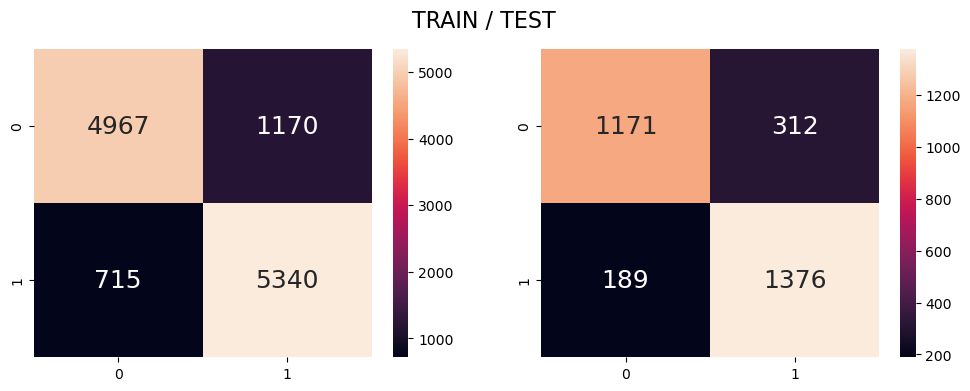

In [21]:
print("Accuracy of first baron kill timing classification tree.")
showTreeAccuracy(baronTree, baronTree_data)

Accuracy of first player kill timing classification tree.
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5760334645669292

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5711942257217848



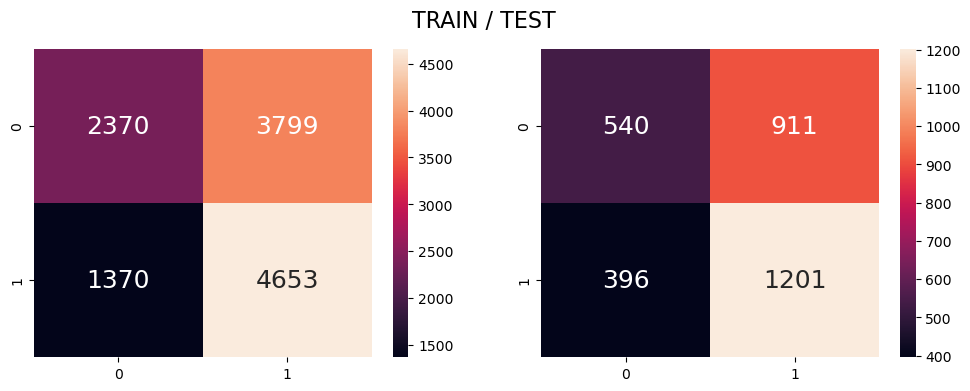

In [22]:
print("Accuracy of first player kill timing classification tree.")
showTreeAccuracy(killTree, killTree_data)

Accuracy of COMBINED firsts timing classification tree.
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.953494094488189

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9435695538057742



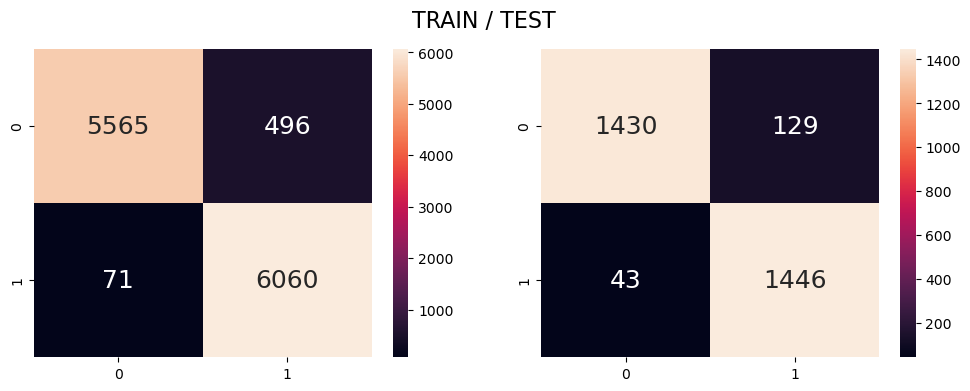

In [23]:
print("Accuracy of COMBINED firsts timing classification tree.")
showTreeAccuracy(combinedTree, combinedTree_data)

# Going Further: The Random Forest Classifier
### Random Forest is a machine learning technique where from the same set of variables, many randomly generated classification trees are produced. A prediction is then generated by putting an input in all of the generated classification trees, and the prediction is calculated by a majority vote.

Let's try that and see if it improves the predictor.

In [24]:
from sklearn.ensemble import RandomForestClassifier

#function to get the tree against win with 80:20 train test split, along with test data

def getForest(var, depth=5, numberOfTrees=400):
    #getting the series data for each variable
    resultSeries = (teamDataValues['win'])
    varSeries = (teamDataValues[var])
    #dropping indexes that have None in them
    indexesDropped = []
    for x in range(len(teamDataValues)):
        if varSeries[x] == None:
            indexesDropped.append(x)
    resultSeries = resultSeries.drop(indexesDropped)
    varSeries = varSeries.drop(indexesDropped)
    resultSeries = pd.DataFrame(resultSeries)
    varSeries = pd.DataFrame(varSeries)
    #forming train and test set.
    varSeries_train, varSeries_test, resultSeries_train, resultSeries_test = train_test_split(varSeries, resultSeries, test_size = 0.20)
    #create and fit the forest 
    forest = RandomForestClassifier(max_depth=depth, n_estimators=numberOfTrees, random_state=2)
    forest.fit(varSeries_train, resultSeries_train)
    trainTestdata = (varSeries_train, varSeries_test, resultSeries_train, resultSeries_test)
    return forest, trainTestdata

def showForestAccuracy(forest, forest_data):
    #get train/test data
    X_train, X_test, y_train, y_test = forest_data
    #make predictions from train and test data
    y_train_pred = forest.predict(X_train)
    y_test_pred = forest.predict(X_test)
    # Check the Goodness of Fit (on Train Data)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Classification Accuracy \t:", forest.score(X_train, y_train))
    print()
    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", forest.score(X_test, y_test))
    print()
    # Plot the Confusion Matrix for Train and Test
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    f.suptitle("TRAIN / TEST", fontsize=16)
    sb.heatmap(confusion_matrix(y_train, y_train_pred),
            annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
    sb.heatmap(confusion_matrix(y_test, y_test_pred), 
            annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6696194225721784

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6692913385826772



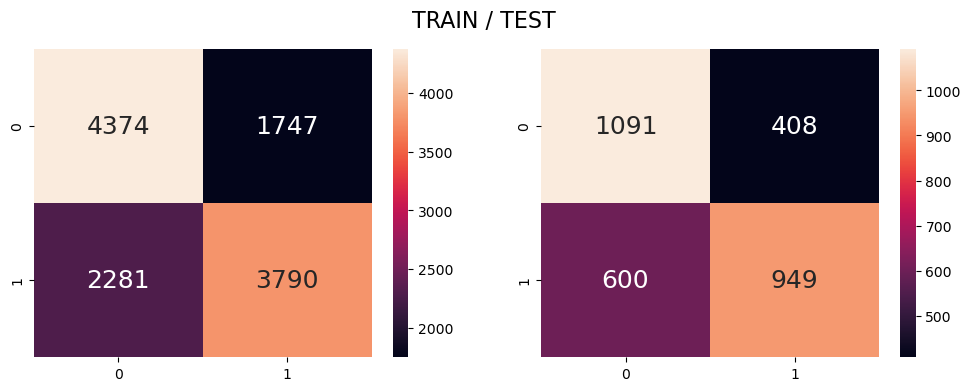

In [25]:
towerForest, towerForest_data = getForest("firstTower")
showForestAccuracy(towerForest, towerForest_data)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9492290026246719

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.948490813648294



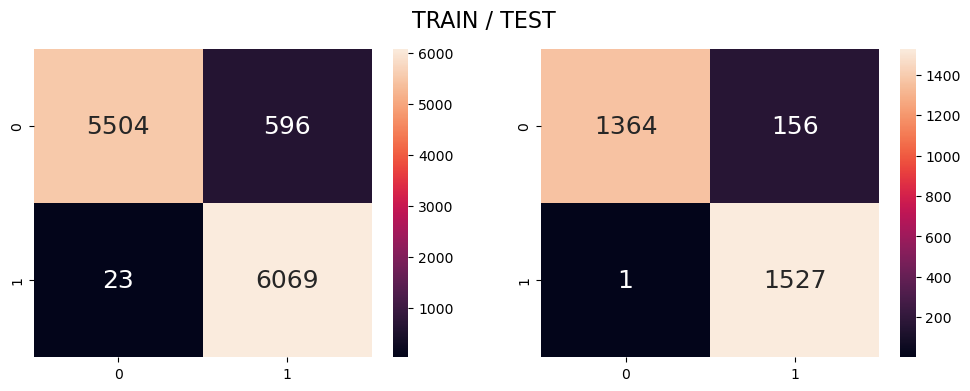

In [26]:
inhibForest, inhibForest_data = getForest("firstInhib")
showForestAccuracy(inhibForest, inhibForest_data)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6892224409448819

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6745406824146981



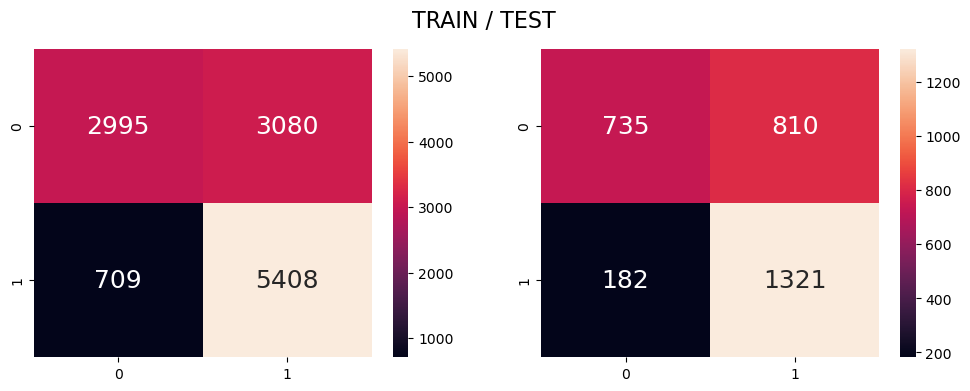

In [27]:
dragonForest, dragonForest_data = getForest("firstDragon")
showForestAccuracy(dragonForest, dragonForest_data)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.8419455380577427

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8464566929133859



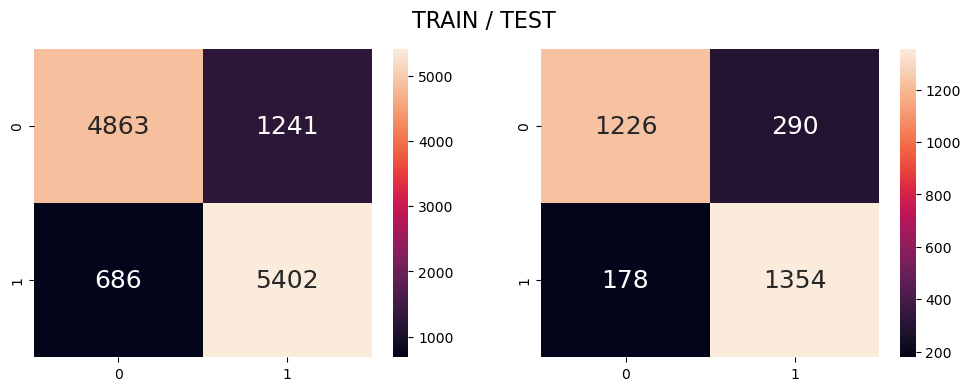

In [28]:
baronForest, baronForest_data = getForest("firstBaron")
showForestAccuracy(baronForest, baronForest_data)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5814468503937008

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5685695538057742



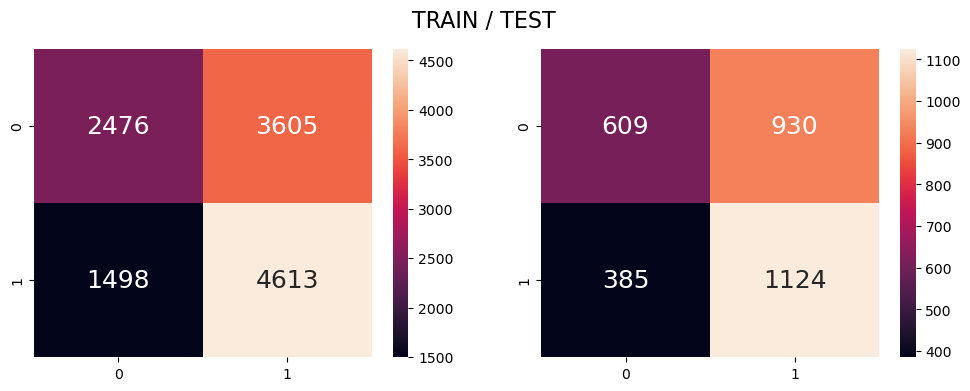

In [29]:
killForest, killForest_data = getForest("firstKill")
showForestAccuracy(killForest, killForest_data)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9496391076115486

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9478346456692913



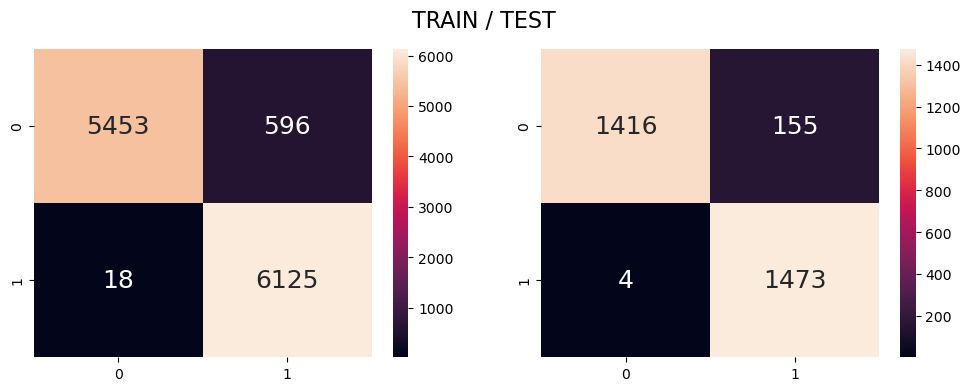

In [30]:
#clear out all rows that have None
indexesToBeDropped = []
for var in teamDataValues:
    for index in range(len(teamDataValues)):
        if teamDataValues[var][index] == None:
            indexesToBeDropped.append(index)
teamDataValues_noNull = teamDataValues.drop(indexesToBeDropped)
teamDataValues_noNull.head(len(teamDataValues_noNull))
combined = teamDataValues_noNull[['firstTower', 'firstDragon', 'firstBaron', 'firstKill', 'firstInhib']]
result = teamDataValues_noNull[['win']]
combinedF_train, combinedF_test, resultF_train, resultF_test = train_test_split(combined, result, test_size = 0.20)
combinedForest_data = (combinedF_train, combinedF_test, resultF_train, resultF_test)

combinedForest = RandomForestClassifier(max_depth=5, n_estimators=400, random_state=2)
combinedForest.fit(combinedF_train, resultF_train)
showForestAccuracy(combinedForest, combinedForest_data)

### To prove the randomness of the random forest, we will print 3 trees, out of the 400 that were generated for the forest with combined variables. Notice that the values of nodes have changed.

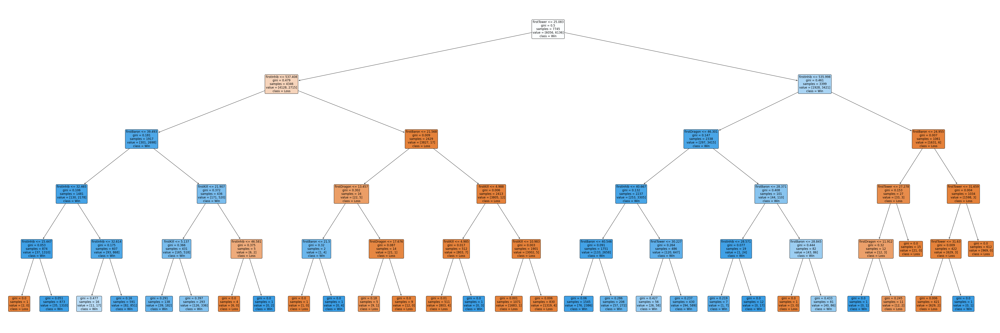

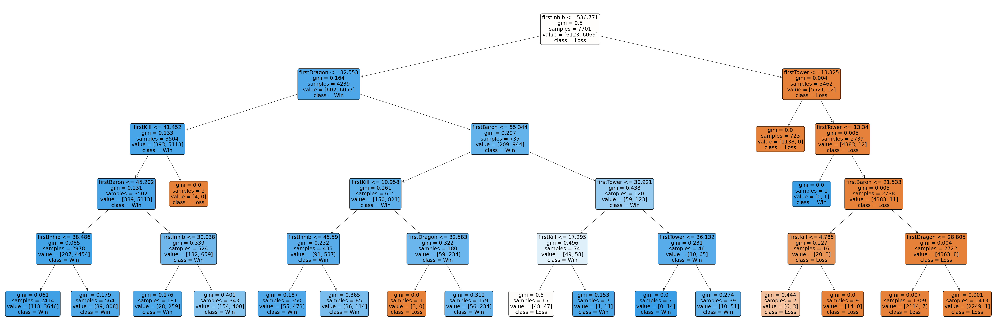

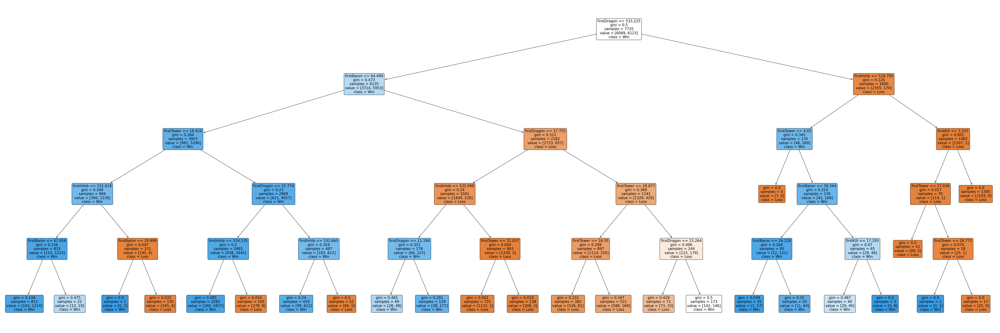

In [31]:
import random
printTree(combinedForest.estimators_[random.randint(0,400)], combinedForest_data);
printTree(combinedForest.estimators_[random.randint(0,400)], combinedForest_data);
printTree(combinedForest.estimators_[random.randint(0,400)], combinedForest_data);

### As we have seen, even though the Random Forest Classifier uses 400 random trees to get a majority vote, the change in classification accuracy is miniscule. This might be due to the bias in winning that some of these predictors have, as mentioned earlier.

# Predicting 2016 Season World Championship Finals

#### Let's take a look at the League of Legends Season World Championship 2016's Finals SKT vs Samsung Galaxy's match

In [33]:
temp = gameData[gameData['League'] == 'WC']
temp = temp[temp['Year'] == 2016]
temp = temp[(temp['blueTeamTag'] == 'SKT') | (temp['redTeamTag'] == 'SKT')]
temp = temp[(temp['blueTeamTag'] == 'SSG') | (temp['redTeamTag'] == 'SSG')]
temp = temp.reset_index(drop=True)
WCSeason2016 = temp
WCSeason2016

WCSeason2016 = temp.filter(['bResult', 'bInhibs','bTowers', 'bDragons', 'bBarons','bKills'], axis=1)

for x in WCSeason2016:
    if x != 'bResult':
        WCSeason2016[x] = WCSeason2016[x].apply(ast.literal_eval) #changing all the string values to lists.

for x in WCSeason2016:
    if x != 'bResult':
        for y in range(5):
            if WCSeason2016[x][y] != []:
                WCSeason2016[x][y] = WCSeason2016[x][y][0][0]
            else:
                WCSeason2016[x][y] = 999
    else:
        for y in range(5):
            if WCSeason2016[x][y] == 1:
                WCSeason2016[x][y] = True
            else:
                WCSeason2016[x][y] = False

WCSeason2016.rename(columns={'bResult':'Blue Wins'}, inplace=True)
WCSeason2016

,Blue Wins,bInhibs,bTowers,bDragons,bBarons,bKills
0,False,999,39.483,28.018,47.456,8.673
1,True,30.952,30.862,22.966,26.963,9.535
2,True,51.39,30.951,67.743,30.344,25.622
3,False,999,19.443,26.851,999,18.927
4,False,999,12.183,23.47,999,3.735


### Those were blue team stats for the 2016 Season World Championship Finals

# We will now predict the blue team's result using each of their stats.

In [37]:
#function that predicts outcome based on a single predictor
def singlePrediction(forest, predictor=float):
    arr = [[predictor]]
    return forest.predict(arr)[0]

def singlePrediction_combined(predictor):
    predictor.drop(['Blue Wins', 'Combined Forest'], axis = 1, inplace = True) 
    predictor.rename(columns={'bTowers':'firstTower'}, inplace=True)
    predictor.rename(columns={'bDragons':'firstDragon'}, inplace=True)
    predictor.rename(columns={'bBarons':'firstBaron'}, inplace=True)
    predictor.rename(columns={'bKills':'firstKill'}, inplace=True)
    predictor.rename(columns={'bInhibs':'firstInhib'}, inplace=True)
    return combinedForest.predict(predictor)

predictedResults2016 = WCSeason2016.filter(['Blue Wins','bTowers', 'bDragons', 'bBarons','bKills', 'bInhibs'], axis=1)
predictedResults2016.insert(6, 'Combined Forest', [None, None, None, None, None])

predictedResults2016['Combined Forest'][0] = singlePrediction_combined(predictedResults2016.iloc[[0]])[0]
predictedResults2016['Combined Forest'][1] = singlePrediction_combined(predictedResults2016.iloc[[1]])[0]
predictedResults2016['Combined Forest'][2] = singlePrediction_combined(predictedResults2016.iloc[[2]])[0]
predictedResults2016['Combined Forest'][3] = singlePrediction_combined(predictedResults2016.iloc[[3]])[0]
predictedResults2016['Combined Forest'][4] = singlePrediction_combined(predictedResults2016.iloc[[4]])[0]

for cat in predictedResults2016:
    for index in range(5):
        if predictedResults2016[cat][index] == None:
            continue
        if cat == 'bInhibs':
            predictedResults2016[cat][index] = singlePrediction(inhibForest, predictedResults2016[cat][index])
        if cat == 'bTowers':
            predictedResults2016[cat][index] = singlePrediction(towerForest, predictedResults2016[cat][index])
        if cat == 'bDragons':
            predictedResults2016[cat][index] = singlePrediction(dragonForest, predictedResults2016[cat][index])
        if cat == 'bBarons':
            predictedResults2016[cat][index] = singlePrediction(baronForest, predictedResults2016[cat][index])
        if cat == 'bKills':
            predictedResults2016[cat][index] = singlePrediction(killForest, predictedResults2016[cat][index])

predictedResults2016.rename(columns={'Blue Wins':'Actual Result'}, inplace=True)
predictedResults2016.rename(columns={'bTowers':'Tower Forest'}, inplace=True)
predictedResults2016.rename(columns={'bDragons':'Dragon Forest'}, inplace=True)
predictedResults2016.rename(columns={'bBarons':'Baron Forest'}, inplace=True)
predictedResults2016.rename(columns={'bKills':'Kills Forest'}, inplace=True)
predictedResults2016.rename(columns={'bInhibs':'Inhibitor Forest'}, inplace=True)

predictedResults2016

,Actual Result,Tower Forest,Dragon Forest,Baron Forest,Kills Forest,Inhibitor Forest,Combined Forest
0,False,True,True,True,True,False,False
1,True,True,True,True,True,True,True
2,True,True,True,True,False,True,True
3,False,False,True,False,False,False,False
4,False,False,True,False,True,False,False


##### 'True' - According to the respective forest, it predicted that Blue team will win.
##### 'False' - According to the respective forest, it predicted that Blue team will lose.
##### 'None' - Unable to predict, as data contains missing value.

## Inhibitor Forest and Combined Forest was able to predict the results accurately!

---

Continue in `KNN.ipynb`